### First Step

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal as signal
import mne


In [34]:
import os

data_path = ".\subjects"
files = sorted([f for f in os.listdir(data_path) if f.endswith(".edf")])
raw_data = {}
for fname in files:
    subject_id = fname.replace(".edf", "")
    
    raw = mne.io.read_raw_edf(
        os.path.join(data_path, fname),
        preload=True,
        verbose=False
    )
    
    raw.pick_types(eeg=True)
    
    raw_data[subject_id] = raw
    


NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).
NOTE: pick_types() is a legacy function. New code should use inst.pick(...).


In [35]:
raw_data["Subject_01"]

<RawEDF | Subject_01.edf, 20 x 183600 (367.2 s), ~28.0 MiB, data loaded>

Plotting Subject_01


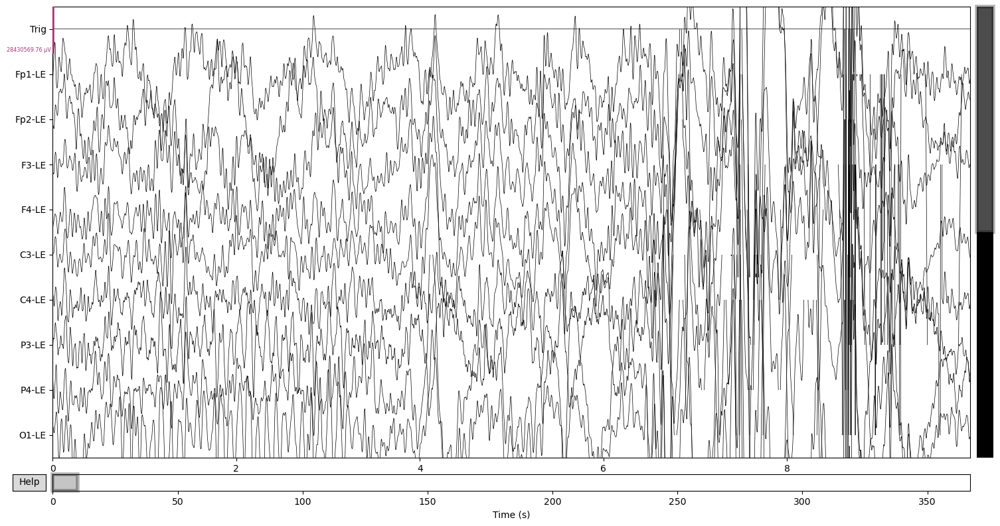

Plotting Subject_02


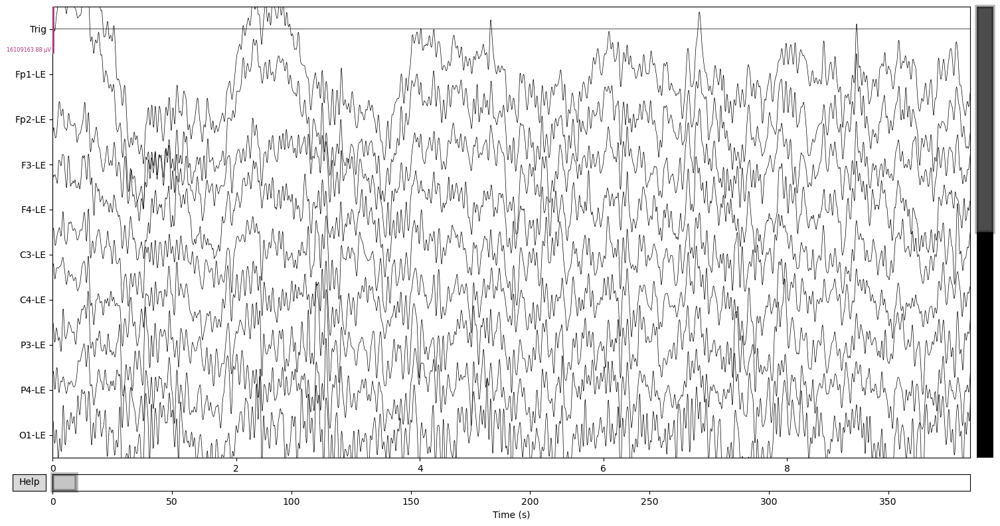

Plotting Subject_03


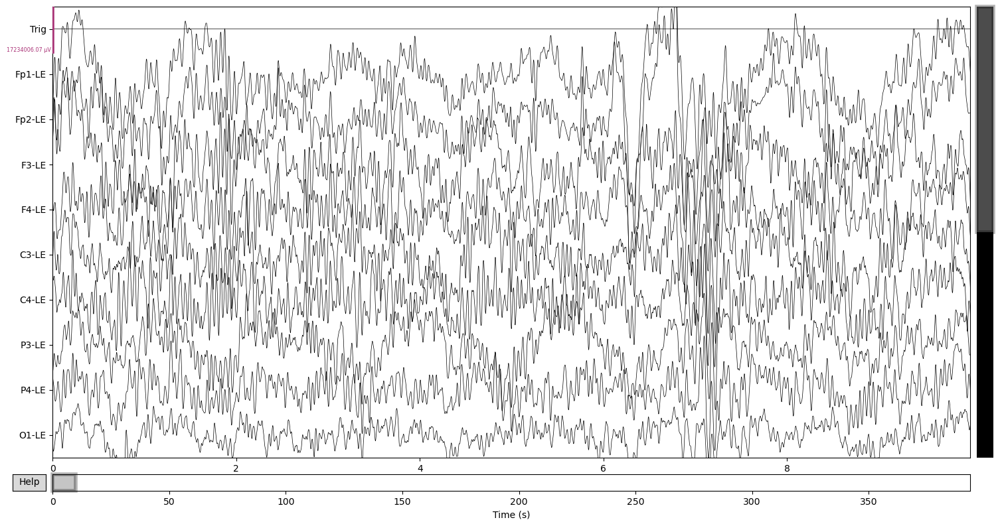

Plotting Subject_04


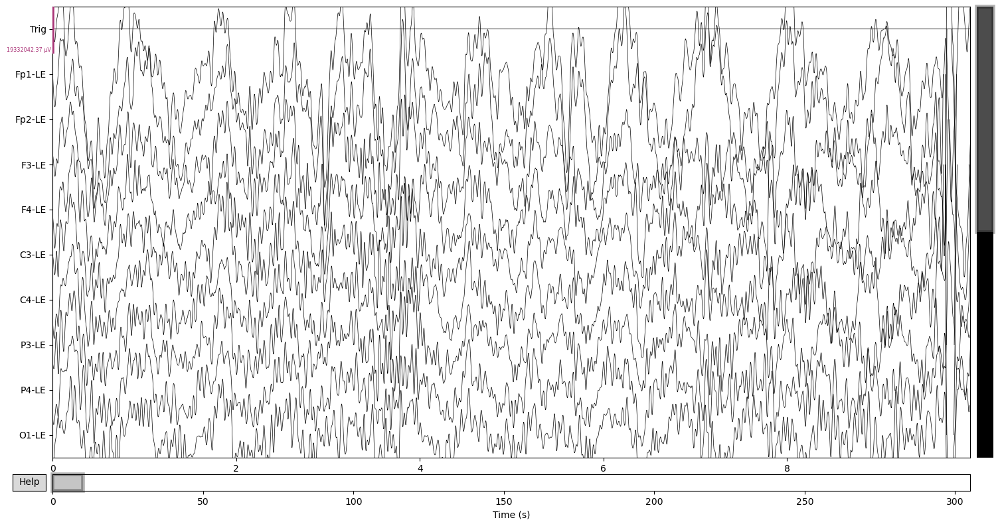

Plotting Subject_05


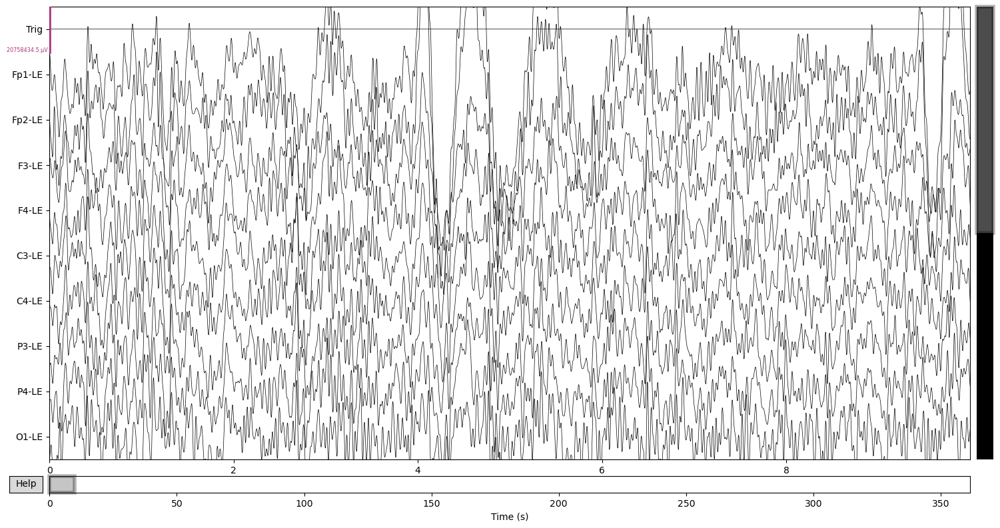

Plotting Subject_06


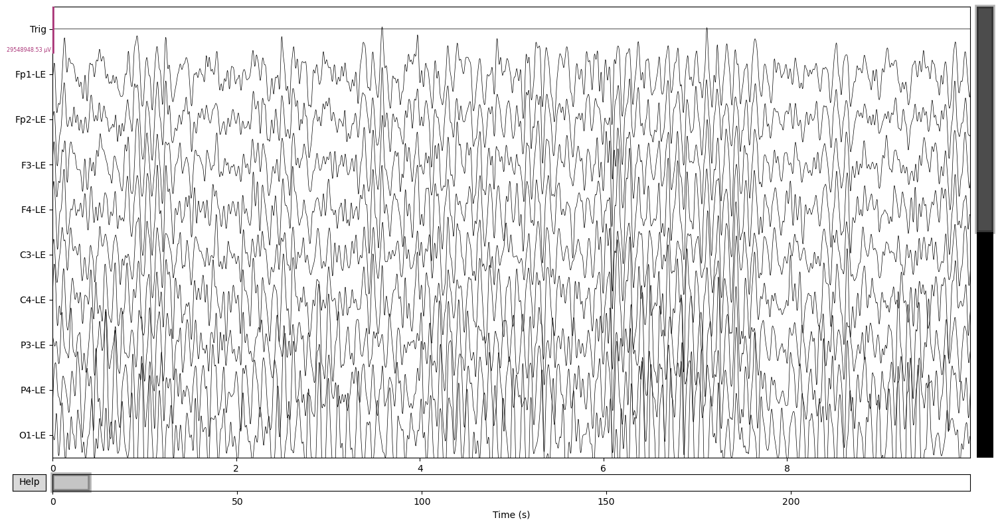

Plotting Subject_07


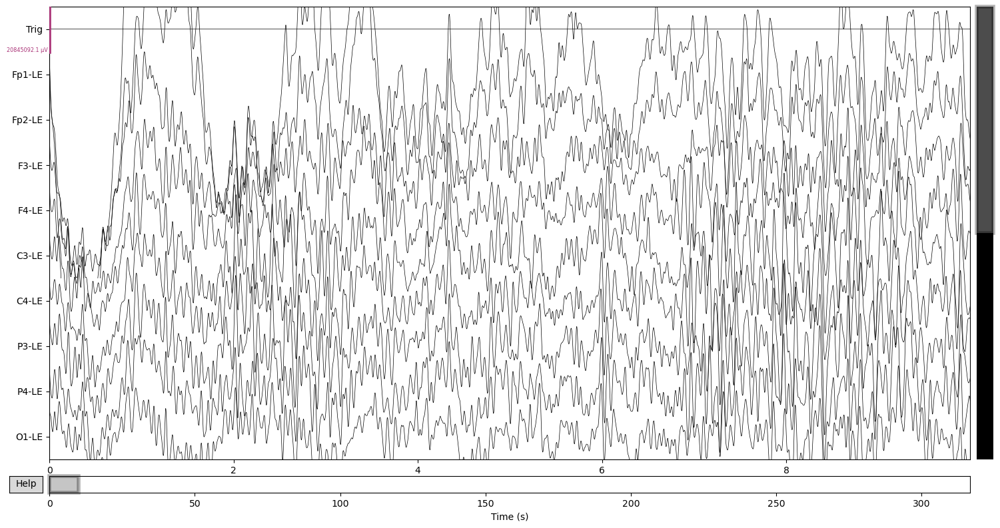

Plotting Subject_08


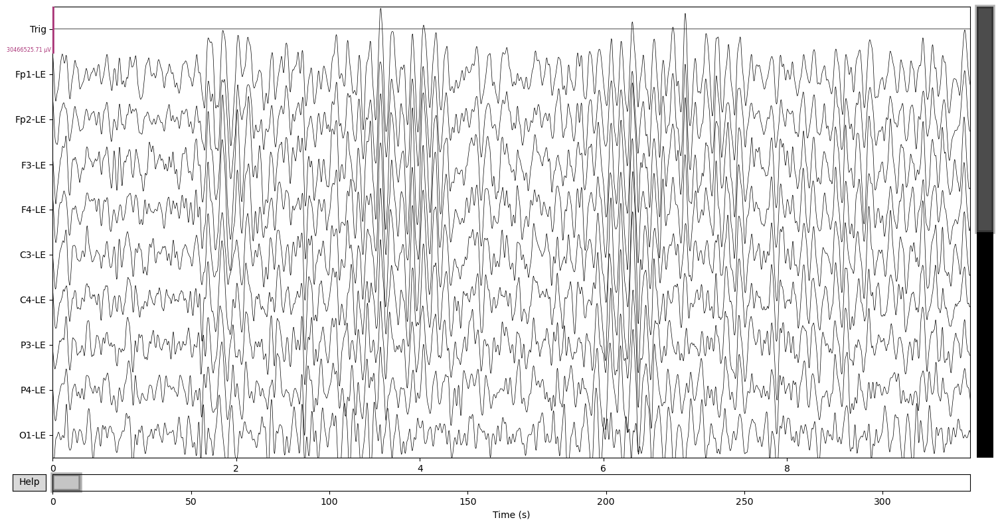

Plotting Subject_09


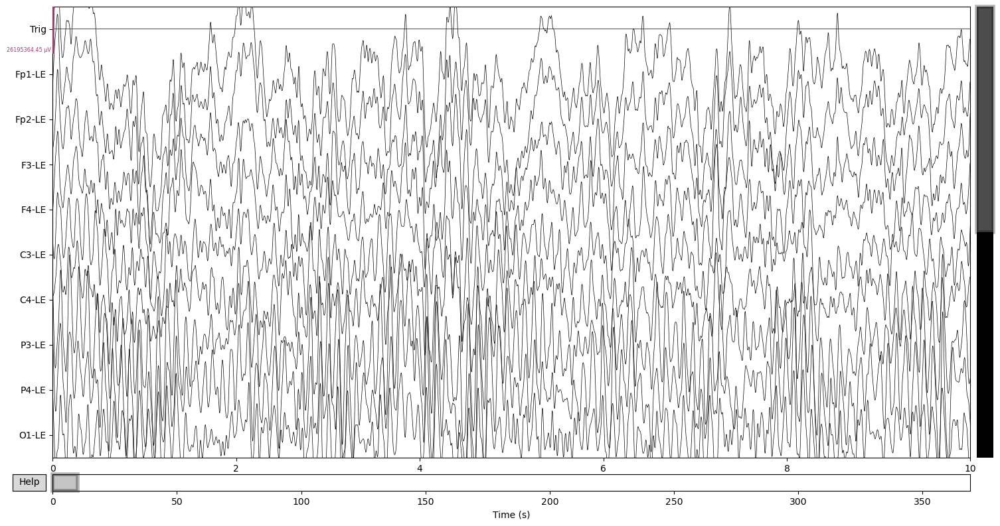

Plotting Subject_10


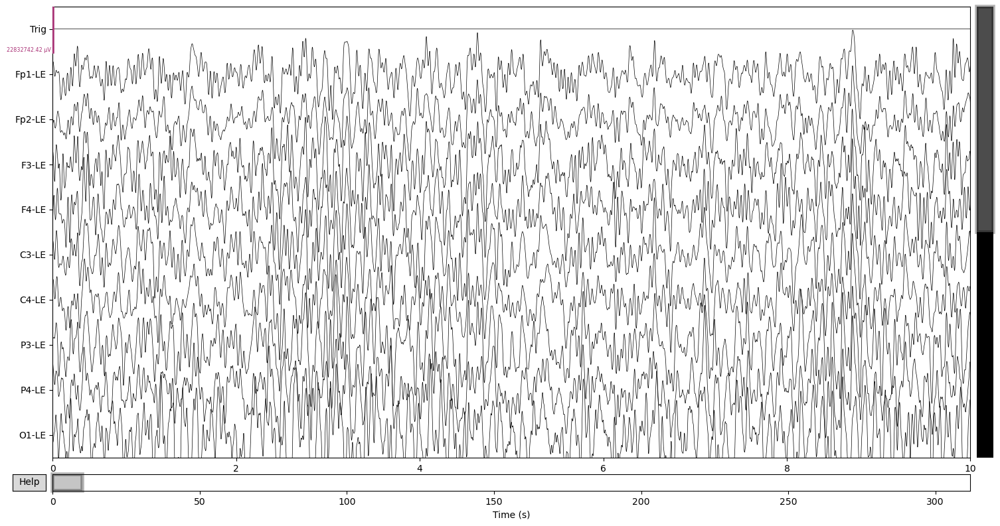

In [36]:
# %matplotlib qt

for subject_id, raw in raw_data.items():
    print(f"Plotting {subject_id}")
    raw.plot(duration=10, n_channels=10, scalings='auto')

In [37]:
from scipy.signal import butter, filtfilt, freqz

# Band-pass filter design parameters
lowcut = 0.5
highcut = 45.0
order = 4

# Sampling frequency extracted from EEG data
sfreq = raw_data["Subject_01"].info['sfreq']  

# Normalizing
nyquist = sfreq / 2
low = lowcut / nyquist
high = highcut / nyquist

# Designing a Butterworth band-pass filter
b, a = butter(order, [low, high], btype='bandpass')


In [38]:
#frequency response
w, h = freqz(b, a, worN=2048)
freqs = w * sfreq / (2 * np.pi)

C:\Users\pc\AppData\Local\Temp\ipykernel_18884\1925242318.py:3: RuntimeWarning: divide by zero encountered in log10
  plt.plot(freqs, 20 * np.log10(np.abs(h)))


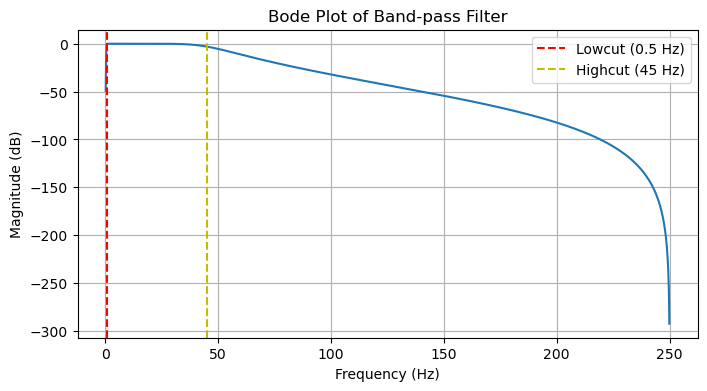

In [39]:
# Plotting the Bode plot 
plt.figure(figsize=(8,4))
plt.plot(freqs, 20 * np.log10(np.abs(h)))
plt.xlabel("Frequency (Hz)")
plt.ylabel("Magnitude (dB)")
plt.title("Bode Plot of Band-pass Filter")
plt.axvline(lowcut, color='r', linestyle='--', label='Lowcut (0.5 Hz)')
plt.axvline(highcut, color='y', linestyle='--', label='Highcut (45 Hz)')
plt.legend()
plt.grid(True)
plt.show()

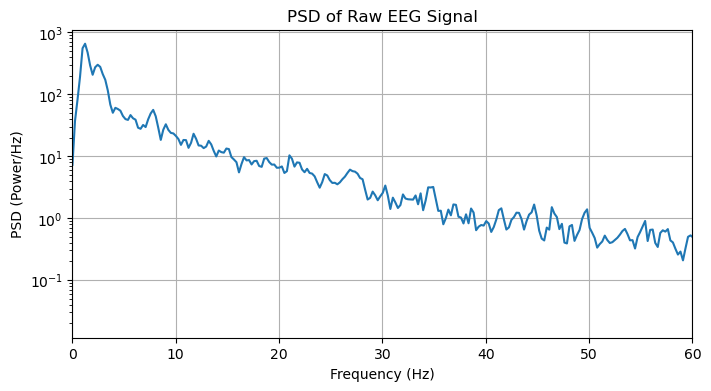

In [40]:
from scipy.signal import welch

raw = raw_data["Subject_01"]
eeg = raw.get_data()
sfreq = raw.info['sfreq']

# PSD calculation using Welch method
freqs, psd = welch(eeg, fs=sfreq, nperseg=2048, axis=1)

# Plot PSD (average over channels)
plt.figure(figsize=(8,4))
plt.semilogy(freqs, psd.mean(axis=0))
plt.xlim(0, 60)
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD (Power/Hz)")
plt.title("PSD of Raw EEG Signal")
plt.grid(True)
plt.show()

In [41]:
#Notch Filter
from scipy.signal import iirnotch, filtfilt

# Notch frequency
f0 = 50.0
# Quality factor
Q = 30.0          

b_notch, a_notch = iirnotch(f0, Q, sfreq)

notch_filtered_data = {}

for subject_id, raw in raw_data.items():
    eeg = raw.get_data()
    eeg_notch = filtfilt(b_notch, a_notch, eeg, axis=1)
    notch_filtered_data[subject_id] = eeg_notch


In [42]:
#Band-pass after Notch
bandpass_filtered_data = {}

for subject_id, eeg_notch in notch_filtered_data.items():
    eeg_band = filtfilt(b, a, eeg_notch, axis=1)
    bandpass_filtered_data[subject_id] = eeg_band

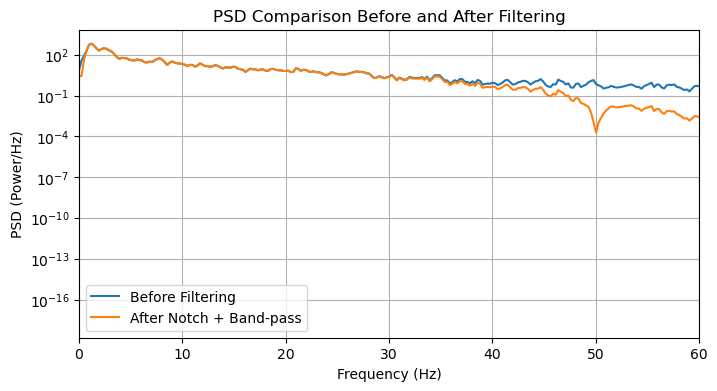

In [43]:
#PSD after filtering
eeg_filtered = bandpass_filtered_data["Subject_01"]

freqs_f, psd_f = welch(eeg_filtered, fs=sfreq, nperseg=2048, axis=1)

plt.figure(figsize=(8,4))
plt.semilogy(freqs, psd.mean(axis=0), label="Before Filtering")
plt.semilogy(freqs_f, psd_f.mean(axis=0), label="After Notch + Band-pass")
plt.xlim(0, 60)
plt.xlabel("Frequency (Hz)")
plt.ylabel("PSD (Power/Hz)")
plt.title("PSD Comparison Before and After Filtering")
plt.legend()
plt.grid(True)
plt.show()


### Second step

In [44]:
raw_filt_data = {}

for subject_id, eeg_band in bandpass_filtered_data.items():
    raw_copy = raw_data[subject_id].copy()
    
    raw_copy._data = eeg_band
    
    raw_filt_data[subject_id] = raw_copy

In [45]:
for subject_id, raw in raw_filt_data.items():
    new_names = {}
    for ch in raw.ch_names:
        if "-LE" in ch:
            new_names[ch] = ch.replace("-LE", "")
    raw.rename_channels(new_names)


In [46]:
montage = mne.channels.make_standard_montage("standard_1020")

for subject_id, raw in raw_filt_data.items():
    if 'Trig' in raw.ch_names:
        raw.drop_channels(['Trig'])
    
        raw.set_montage(montage)


In [47]:
#Epoching
epochs_data = {}
epoch_length = 2  

for subject_id, raw in raw_filt_data.items():
    sfreq = raw.info['sfreq']
    n_samples = raw.n_times
    n_channels = raw.info['nchan']
    
    samples_per_epoch = int(epoch_length * sfreq)
    eeg_data = raw.get_data()
    
    n_epochs = n_samples // samples_per_epoch
    
    epochs_list = []
    for i in range(n_epochs):
        start = i * samples_per_epoch
        stop = start + samples_per_epoch
        epoch = eeg_data[:, start:stop]
        epochs_list.append(epoch)
    
    epochs_data[subject_id] = np.array(epochs_list)


In [53]:
from autoreject import AutoReject
import mne
import matplotlib.pyplot as plt

cleaned_epochs_data = {}
reject_logs = {}

for subject_id, raw in raw_filt_data.items():
    print(f"Running AutoReject for {subject_id}")
    
    sfreq = raw.info['sfreq']
    samples_per_epoch = int(2 * sfreq)
    events = np.array([[i * samples_per_epoch, 0, 1] for i in range(len(epochs_data[subject_id]))])
    
    epochs_mne = mne.Epochs(raw, events, tmin=0, tmax=2, baseline=None, preload=True, verbose=False)

    ar = AutoReject(n_interpolate=[1, 2, 4], random_state=42, verbose=False)
    
    epochs_clean, reject_log = ar.fit_transform(epochs_mne, return_log=True)
    
    cleaned_epochs_data[subject_id] = epochs_clean
    
    cleaned_epochs_data[subject_id] = epochs_clean
    reject_logs[subject_id] = reject_log
    
    # print(f"Plotting Reject Log for {subject_id}...")
    
    # fig, ax = plt.subplots(figsize=(12, 6))
    
    # reject_log.plot(orientation='horizontal', show_names=True, ax=ax, aspect='auto')
    
    # ax.set_title(f"Artifact Rejection Log - {subject_id}\n(Green: Good, Blue: Interpolated, Red: Dropped)", fontsize=12)
    # plt.tight_layout()
    # plt.show()
    

print("Preprocessing Step 2.3 Finished.")

Running AutoReject for Subject_01
Dropped 47 epochs: 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 38, 44, 45, 55, 70, 76, 77, 89, 90, 91, 92, 93, 94, 95, 97, 98, 102, 116, 117, 120, 121, 122, 123, 124, 131, 132, 133, 135, 136, 137, 138, 139, 153, 160, 177, 178
Running AutoReject for Subject_02
Dropped 7 epochs: 18, 19, 79, 89, 90, 91, 92
Running AutoReject for Subject_03
Dropped 4 epochs: 10, 11, 119, 120
Running AutoReject for Subject_04
Dropped 9 epochs: 4, 5, 6, 7, 8, 20, 39, 40, 107
Running AutoReject for Subject_05
Dropped 1 epoch: 26
Running AutoReject for Subject_06
Dropped 1 epoch: 69
Running AutoReject for Subject_07
Dropped 12 epochs: 0, 7, 46, 73, 74, 76, 95, 126, 129, 139, 140, 142
Running AutoReject for Subject_08
Dropped 3 epochs: 50, 65, 147
Running AutoReject for Subject_09
Dropped 41 epochs: 0, 1, 2, 6, 8, 9, 26, 27, 28, 29, 42, 43, 47, 61, 66, 67, 68, 71, 72, 73, 79, 80, 81, 84, 85, 86, 87, 90, 91, 92, 95, 96, 116, 118, 125, 131, 137, 141, 168, 169, 170
Running AutoReject for Su

In [73]:
global_bad_channels = {}

for subject_id, r_log in reject_logs.items():
    print(f"Analyzing Global Bad Channels for {subject_id}")
    
    bad_counts = r_log.labels.sum(axis=0) 
    n_epochs = r_log.labels.shape[0]
    
    bad_channels = []
    for idx, count in enumerate(bad_counts):
        bad_ratio = count / n_epochs
        ch_name = r_log.ch_names[idx]
        
        if bad_ratio > 0.7:
            bad_channels.append(ch_name)
            print(f"*Found Bad Channel: {ch_name} ({bad_ratio*100:.1f}% bad)")

    global_bad_channels[subject_id] = bad_channels
    
    if subject_id in cleaned_epochs_data:
        cleaned_epochs_data[subject_id].info['bads'] = bad_channels

    print(f"Summary: {len(bad_channels)} bad channels found.")
    print("-" * 30)

print("Step 2.4 Finished.")

Analyzing Global Bad Channels for Subject_01
*Found Bad Channel: Fp1 (79.2% bad)
*Found Bad Channel: O2 (82.5% bad)
Summary: 2 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_02
Summary: 0 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_03
Summary: 0 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_04
*Found Bad Channel: P3 (70.4% bad)
*Found Bad Channel: O2 (73.0% bad)
Summary: 2 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_05
Summary: 0 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_06
Summary: 0 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_07
*Found Bad Channel: Fp1 (155.7% bad)
Summary: 1 bad channels found.
------------------------------
Analyzing Global Bad Channels for Subject_08
*Found Bad Channel: T6 (117.

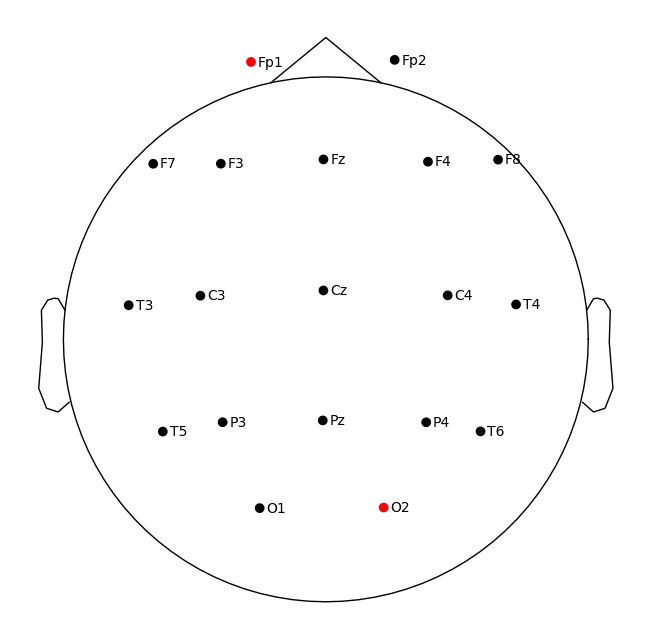

{'Subject_01'}


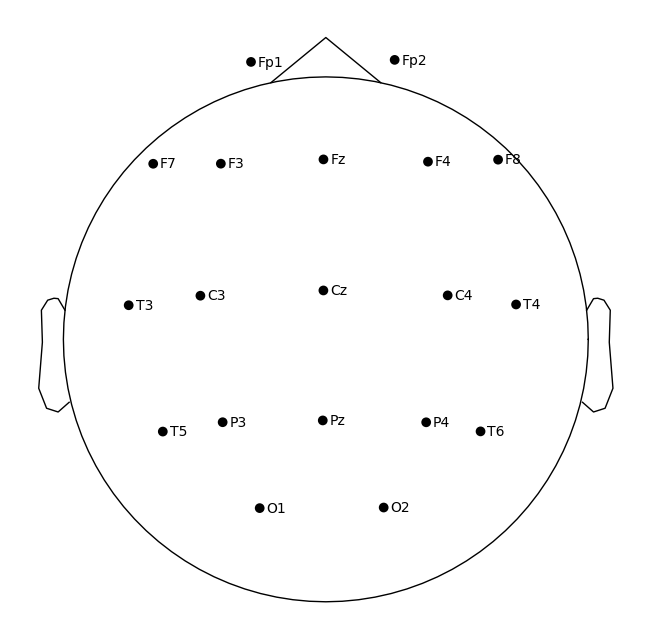

{'Subject_02'}


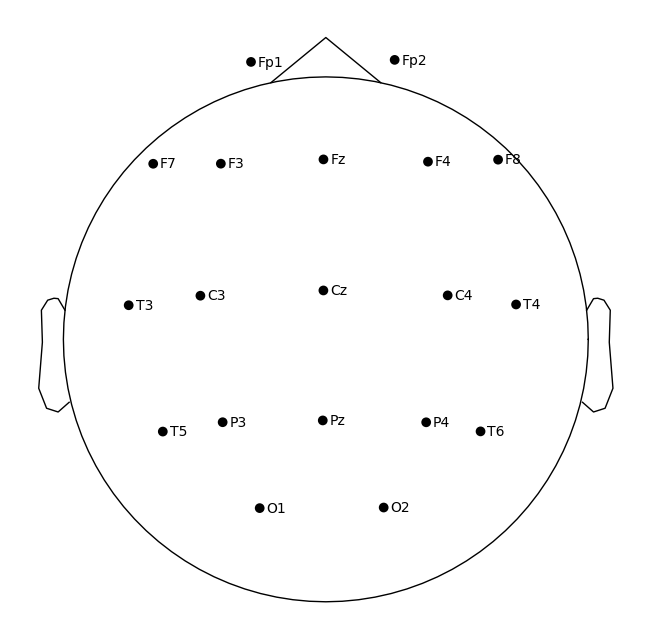

{'Subject_03'}


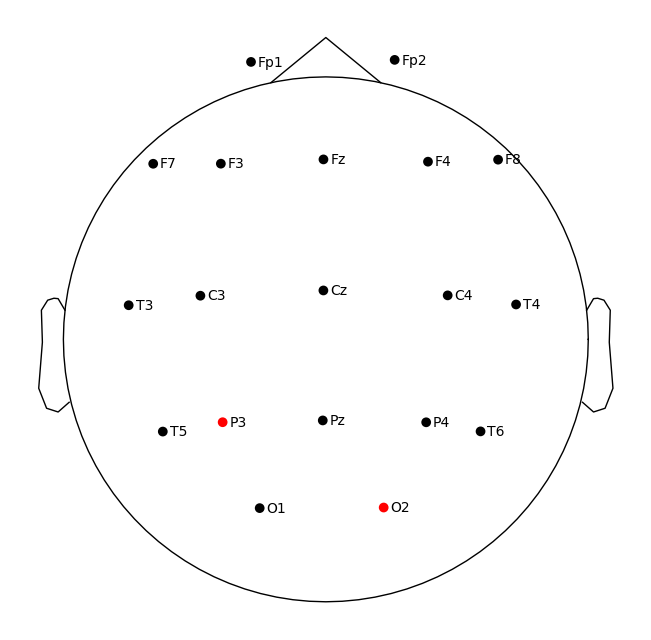

{'Subject_04'}


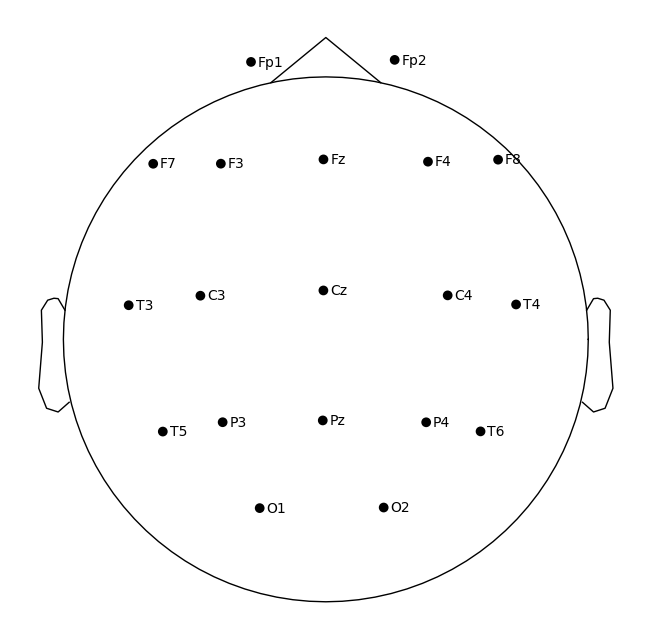

{'Subject_05'}


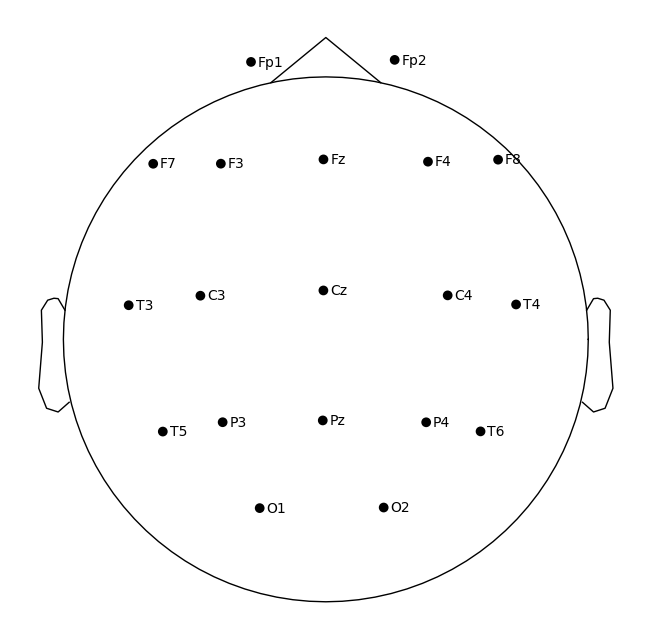

{'Subject_06'}


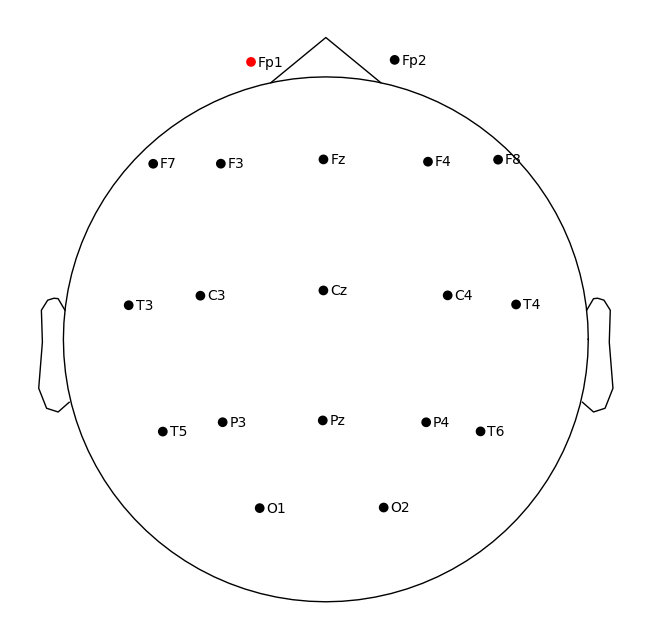

{'Subject_07'}


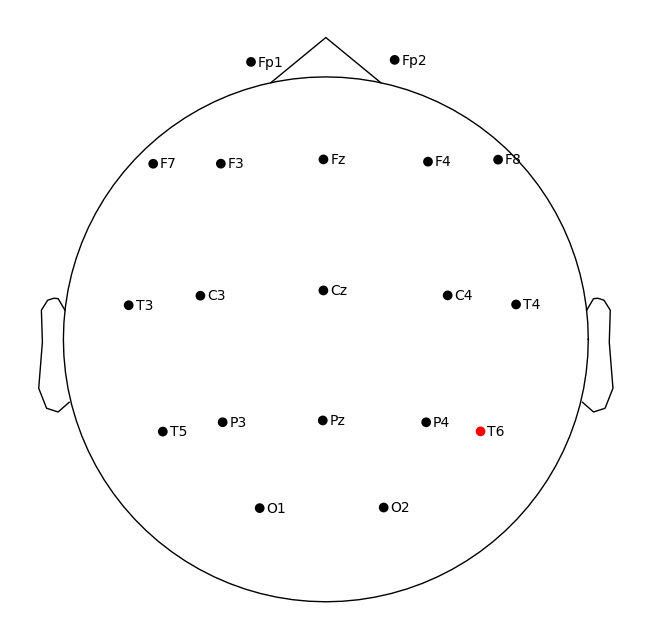

{'Subject_08'}


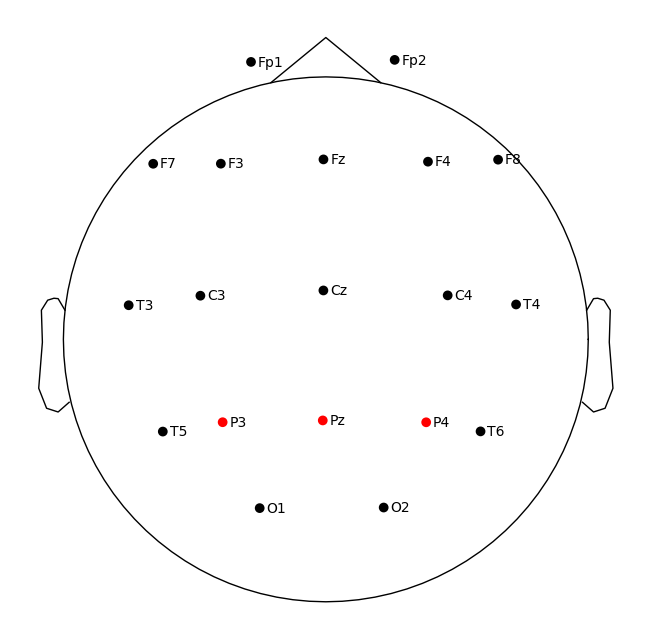

{'Subject_09'}


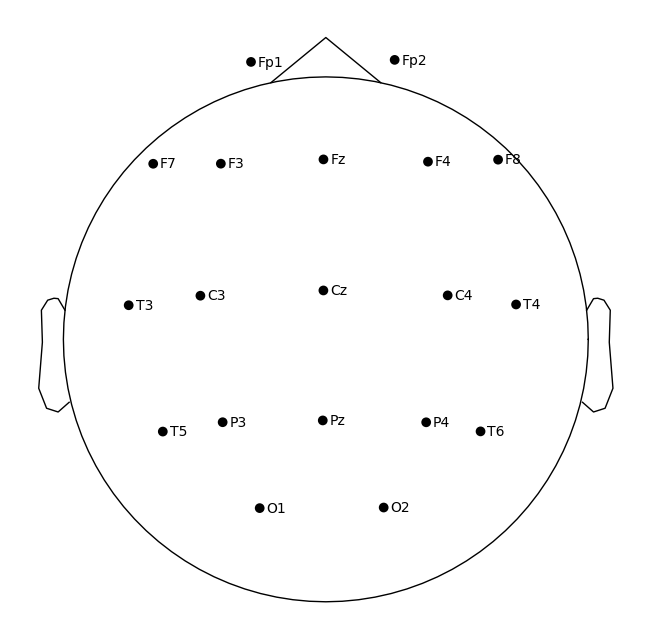

{'Subject_10'}


In [74]:
#Step 2.5.1: Topographic Map of Sensors

montage = mne.channels.make_standard_montage('standard_1020')

for subject_id, epochs in cleaned_epochs_data.items():
    epochs.set_montage(montage)
    # This plot shows the sensors. Red dots = bad channels.
    fig = epochs.plot_sensors(show_names=True, ch_type='eeg')
    fig.suptitle(f"Sensor Layout - {subject_id}", fontsize=14)
    print({subject_id})
    plt.show()

In [75]:
#Step 2.5.2: Channel Interpolation
for subject_id, epochs in cleaned_epochs_data.items():
    if len(epochs.info['bads']) > 0:
        print(f"Reconstructing {len(epochs.info['bads'])} bad channels for {subject_id}...")
        # Reconstructs bad signals from neighbors
        epochs.interpolate_bads(reset_bads=True) 
    else:
        print(f"No reconstruction needed for {subject_id}.")
    print("-" * 30)

print("Interpolation completed for all 10 subjects.")

Reconstructing 2 bad channels for Subject_01...
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.6 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
------------------------------
No reconstruction needed for Subject_02.
------------------------------
No reconstruction needed for Subject_03.
------------------------------
Reconstructing 2 bad channels for Subject_04...
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.6 mm
Computing interpolation matrix from 17 sensor positions
Interpolating 2 sensors
------------------------------
No reconstruction needed for Subject_05.
------------------------------
No reconstruction needed for Subject_06.
------------------------------
Reconstructing 1 bad channels for Subject_07...
Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating b

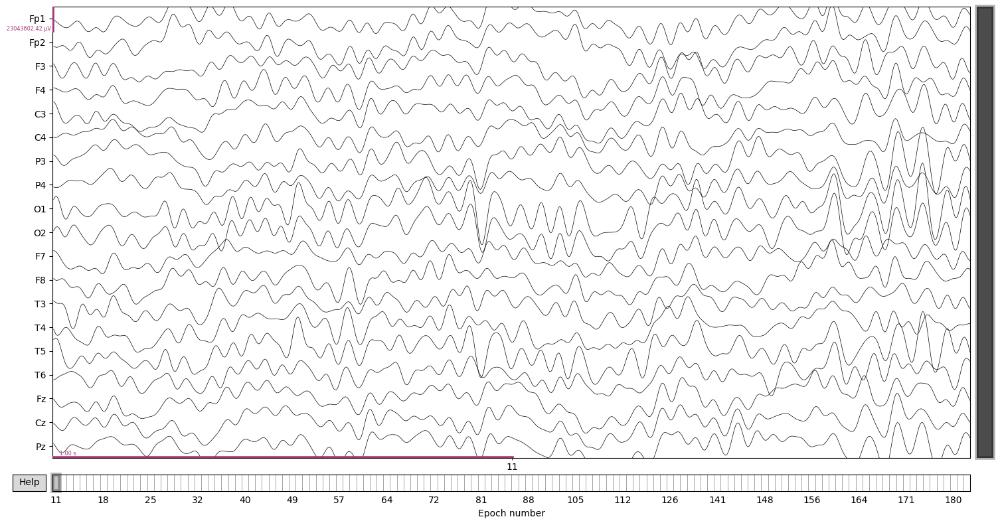

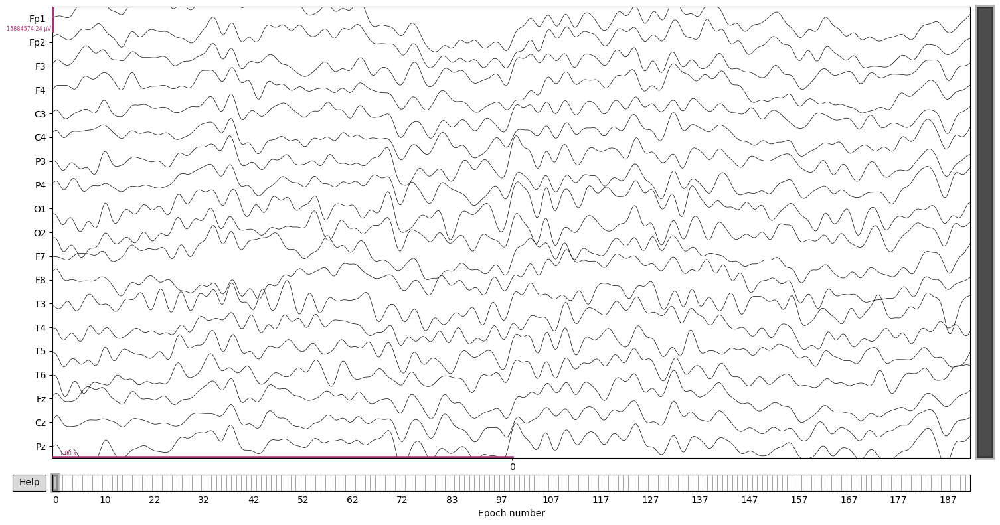

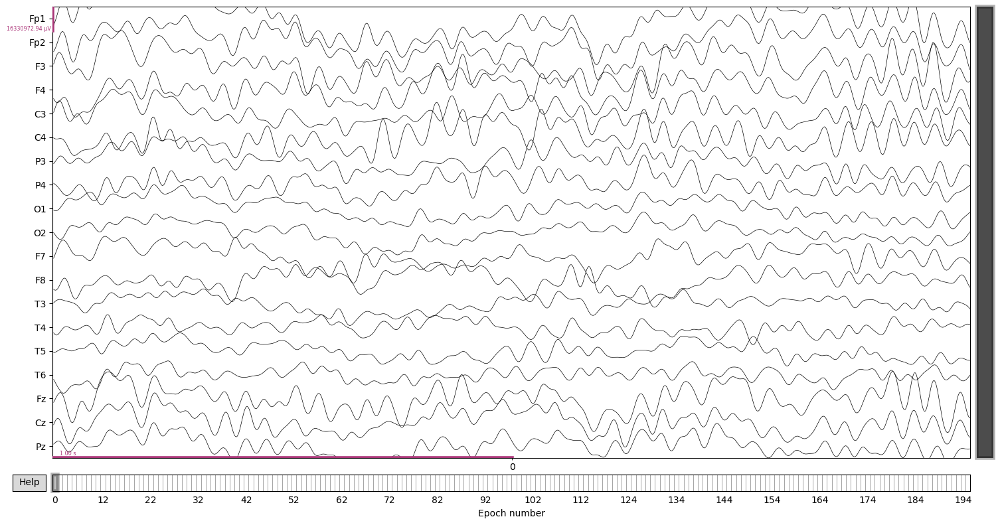

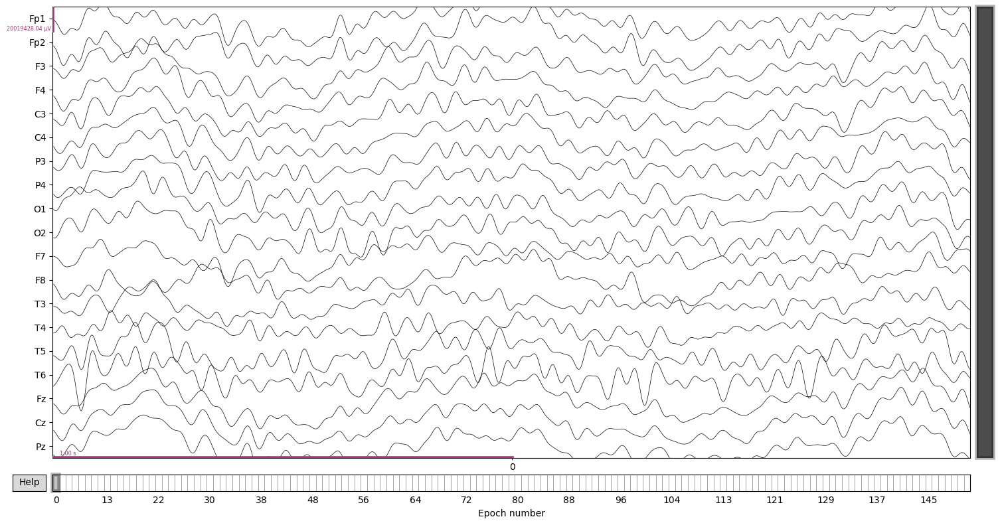

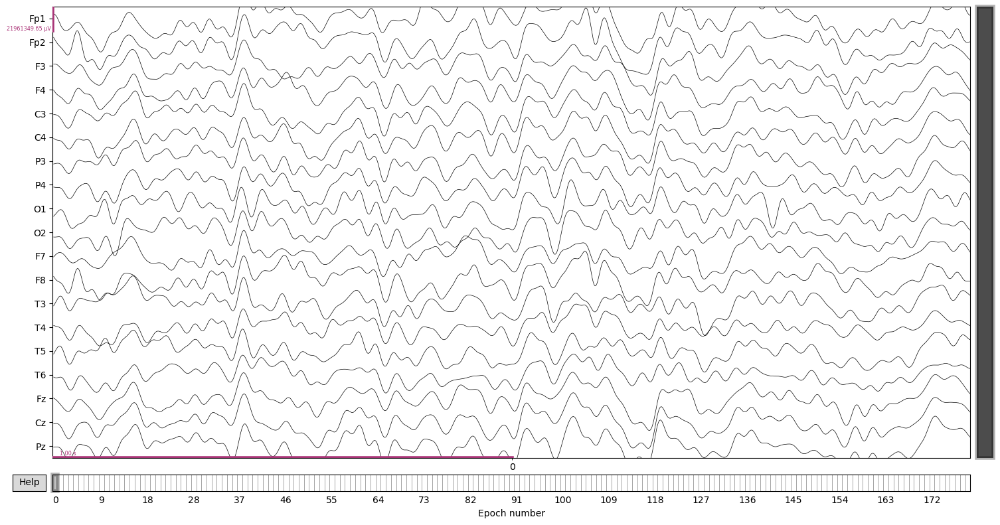

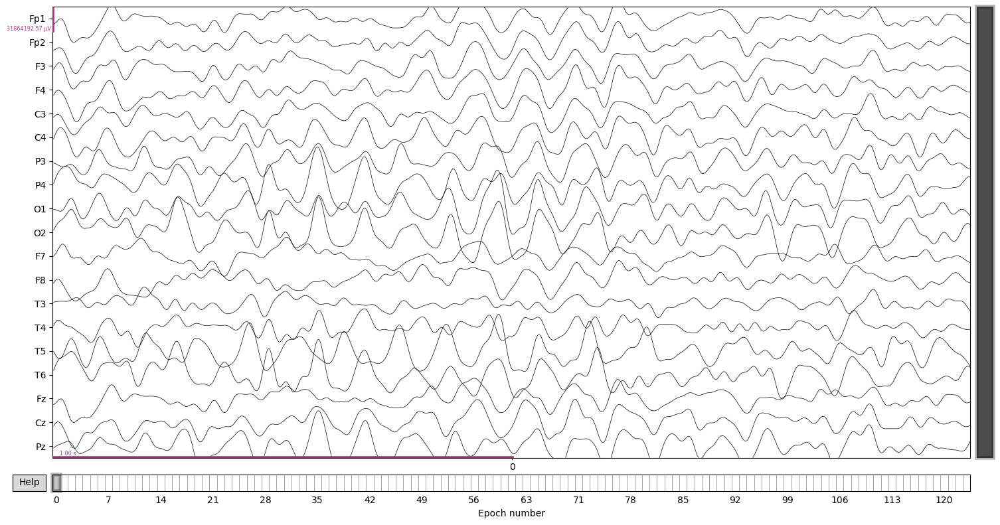

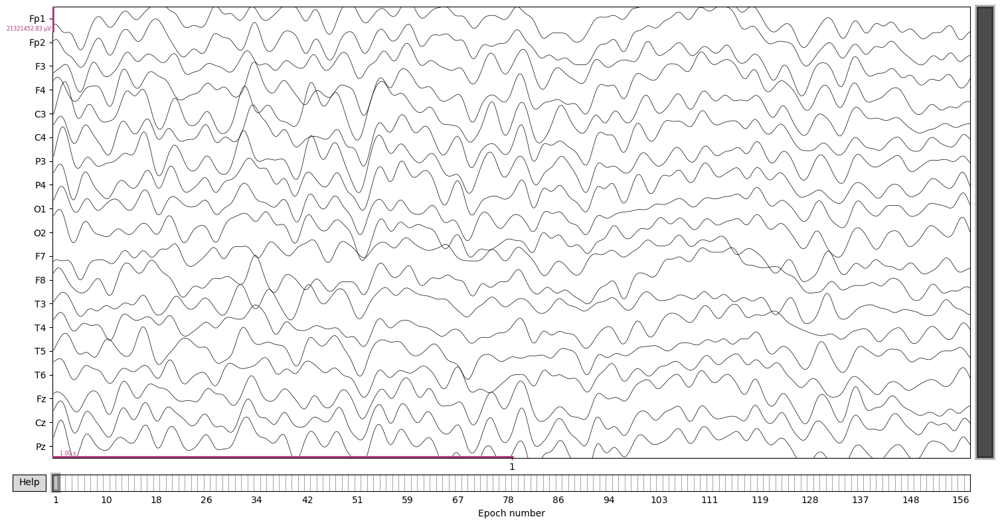

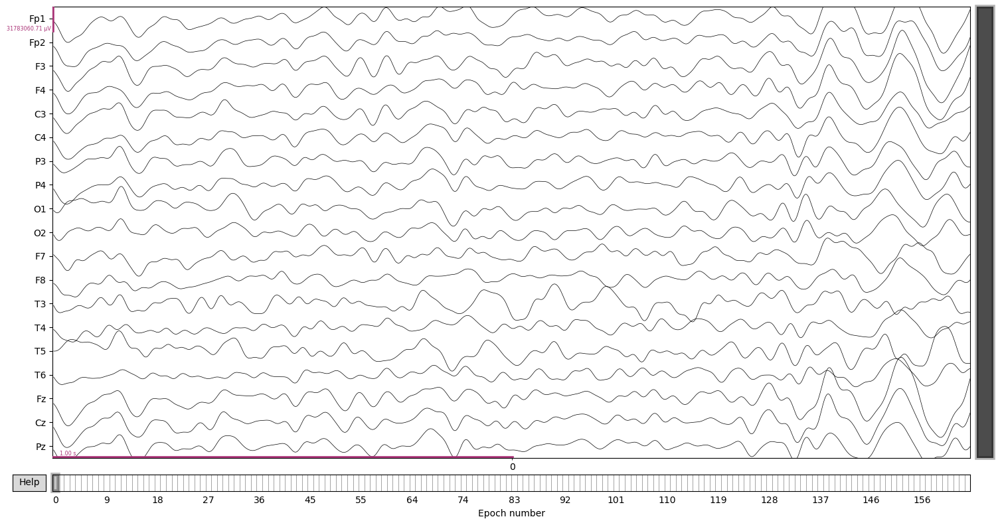

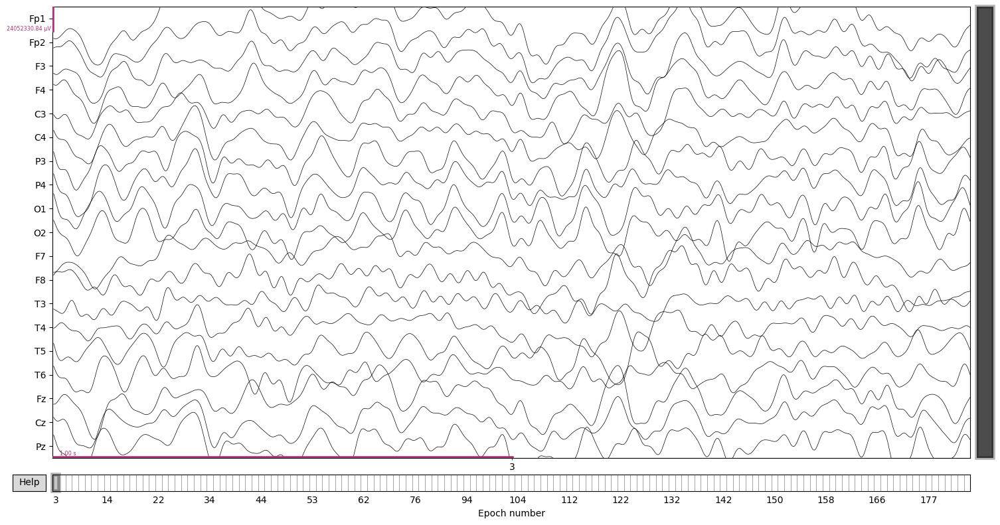

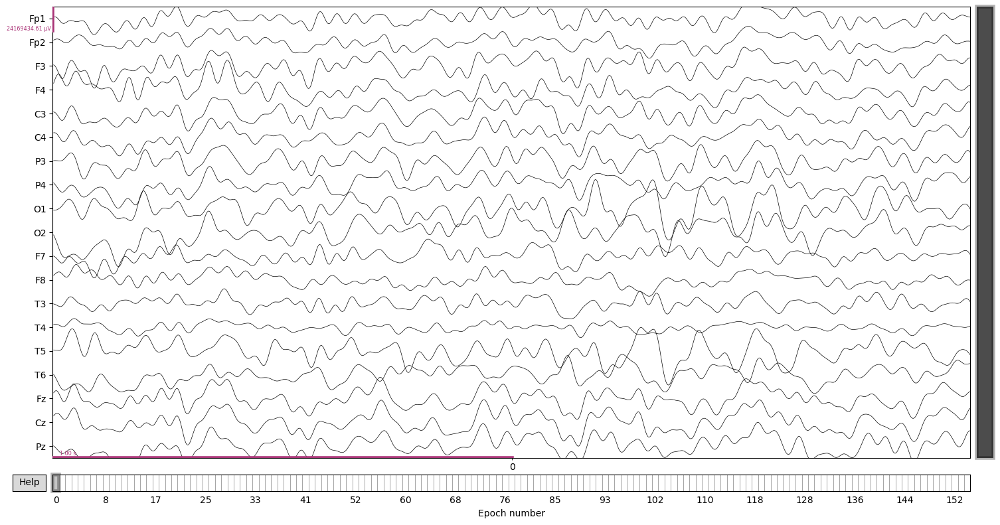

step 2.5 finished.


In [76]:
#Step 2.5.3: Final Signal Check
for subject_id, epochs in cleaned_epochs_data.items():
    # Plotting to verify that previously "Bad" channels now have clean EEG data
    epochs.plot(n_epochs=1, n_channels=19, title=f"Final Reconstructed Data: {subject_id}", scalings='auto')
    plt.show()

print("step 2.5 finished.")